In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [3]:
os.listdir(r'C:\Users\hello\Desktop\Projects\Uber\Datasets')

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

**ETL (Uber 15)**

In [4]:
uber_15 = pd.read_csv(r'C:\Users\hello\Desktop\Projects\Uber\Datasets/uber-raw-data-janjune-15_sample.csv')

In [5]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140


In [6]:
uber_15.shape

(100000, 4)

In [7]:
uber_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   Dispatching_base_num  100000 non-null  object
 1   Pickup_date           100000 non-null  object
 2   Affiliated_base_num   98882 non-null   object
 3   locationID            100000 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 3.1+ MB


In [8]:
uber_15.duplicated().sum()

54

In [9]:
uber_15.drop_duplicates(inplace = True)

In [10]:
uber_15.shape

(99946, 4)

In [11]:
uber_15.isnull().sum()
#As the missing value doesn't affect the analysis, it doesn't need to be removed or replaced

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

In [12]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'])

In [13]:
type(uber_15['Pickup_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [14]:
uber_15['month'] = uber_15['Pickup_date'].dt.month_name()
uber_15['weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['hour'] = uber_15['Pickup_date'].dt.hour

In [15]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,hour
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,21
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,19
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,20
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,17
4,B02764,2015-03-23 07:03:00,B00111,140,March,Monday,7


**Data Analysis (Uber 15)**

<AxesSubplot:xlabel='month'>

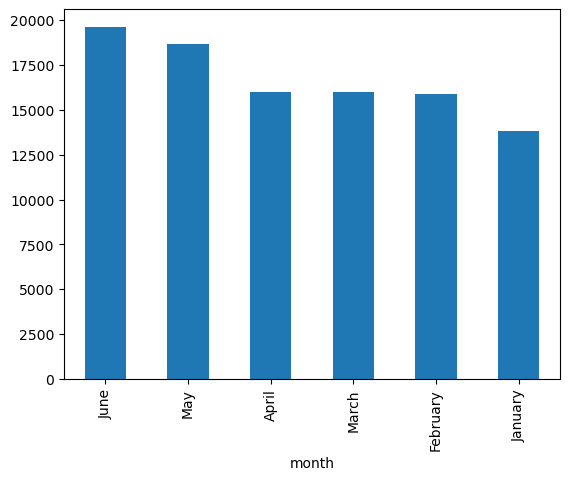

In [16]:
uber_15['month'].value_counts().plot(kind = 'bar')

In [17]:
pivot_month = pd.crosstab(index = uber_15['month'], columns= uber_15['weekday'])
pivot_month

weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,2365,1833,2508,2052,2823,1880,2521
February,2655,1970,2550,2183,2396,2129,2013
January,2508,1353,2745,1651,2378,1444,1740
June,2793,2848,3037,2485,2767,3187,2503
March,2465,2115,2522,2379,2093,2388,2007
May,3262,1865,3519,2944,2627,2115,2328


<AxesSubplot:xlabel='month'>

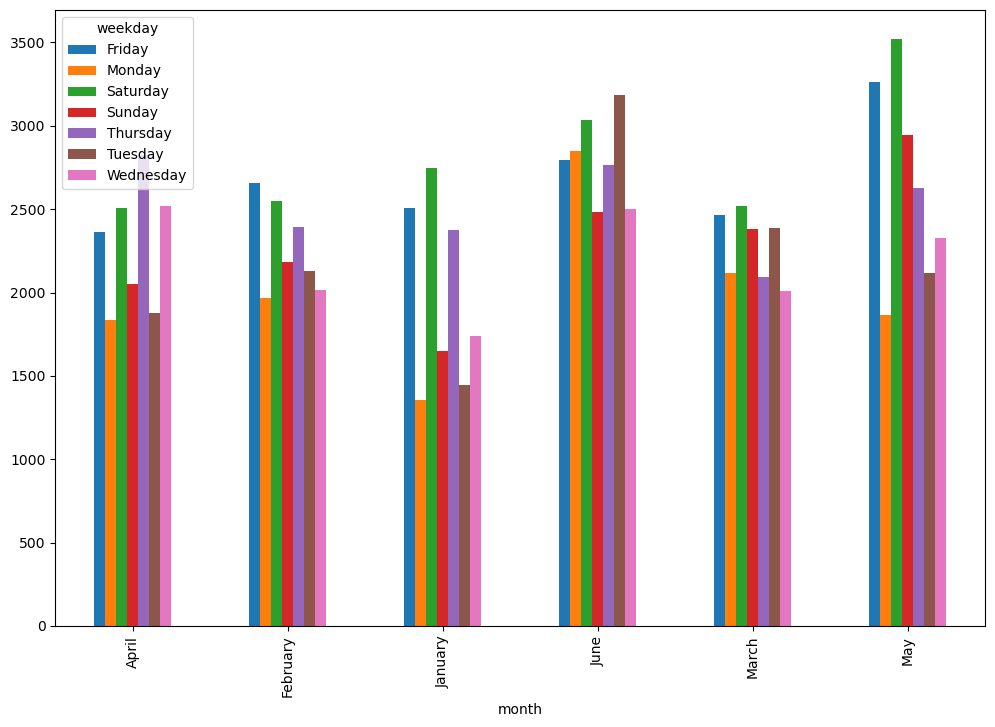

In [18]:
pivot_month.plot(kind = 'bar', figsize = (12,8))

In [19]:
pivot_weekday = uber_15.groupby(['weekday', 'hour'], as_index=False).size()

In [20]:
pivot_weekday

,weekday,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,897
165,Wednesday,21,949
166,Wednesday,22,900


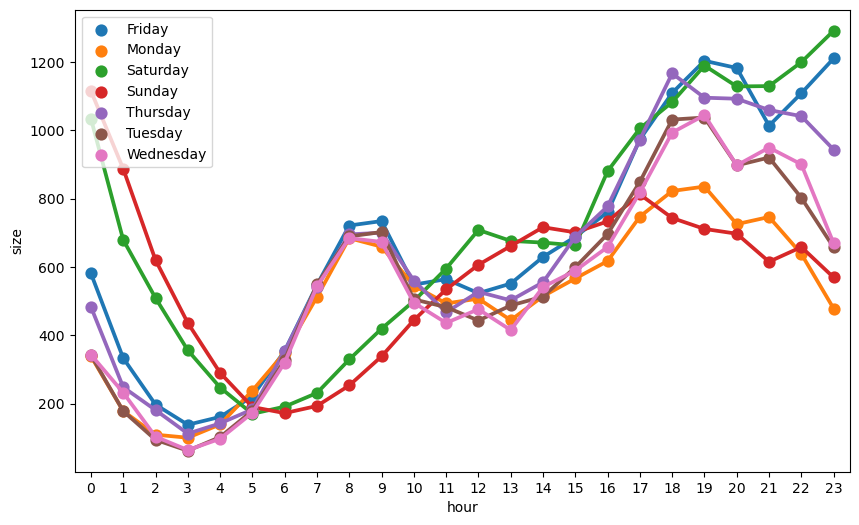

In [21]:
plt.figure(figsize = (10,6))
sns.pointplot(x = 'hour', y = 'size', hue = 'weekday', data = pivot_weekday)
plt.legend(loc = 'upper left')

<AxesSubplot:xlabel='weekday', ylabel='size'>

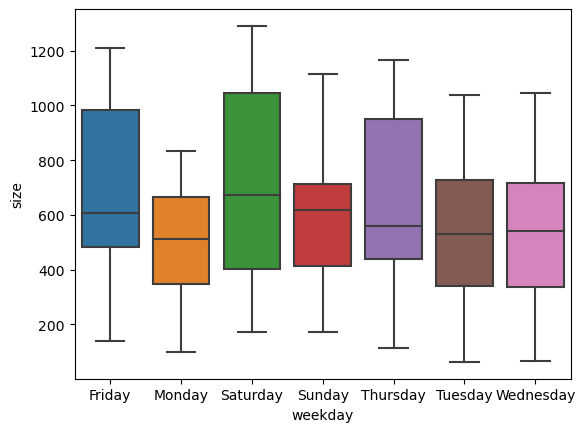

In [22]:
sns.boxplot(x = 'weekday', y ='size', data = pivot_weekday)

**Conclusion:**
1.	From Jan to Jun in 2015, the number of Uber orders increases consecutively. 
2.	Friday and Saturday have the most orders. 
3.	In general, peak hours start at 6am. Uber orders increase gradually until 10am, when the order amount staggers for about 6 hours before peak hours in the afternoon. 
4.	After 9pm, Uber orders decrease except Friday and Saturday 

**EFT Uber 14**

In [23]:
os.listdir(r'C:\Users\hello\Desktop\Projects\Uber\Datasets')

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [24]:
path = r'C:\Users\hello\Desktop\Projects\Uber\Datasets'
list_doc = os.listdir(path)[-8:]
list_doc

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [25]:
list_doc.remove('uber-raw-data-janjune-15_sample.csv')

In [26]:
list_doc.remove('uber-raw-data-janjune-15.csv')

In [27]:
list_doc

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [28]:
uber_14 = pd.DataFrame()
for doc in list_doc:
    temp_df = pd.read_csv(path+'/'+doc)
    uber_14 = pd.concat([uber_14, temp_df])

In [29]:
uber_14.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [30]:
uber_14.shape

(4534327, 4)

In [31]:
uber_14.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4534327 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [32]:
uber_14['Date/Time'] = pd.to_datetime(uber_14['Date/Time'], format = '%m/%d/%Y %H:%M:%S')

In [33]:
uber_14.head()

,Date/Time,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


In [34]:
uber_14['month'] = uber_14['Date/Time'].dt.month_name()
uber_14['weekday'] = uber_14['Date/Time'].dt.day_name()
uber_14['hour'] = uber_14['Date/Time'].dt.hour

In [35]:
def time_analysis(df, col1, col2):
    pivot_table_14 = df.groupby([col1, col2]).size().unstack()
    return sns.heatmap(pivot_table_14, cmap = 'Blues')

**EDA Uber 14**

<AxesSubplot:xlabel='hour', ylabel='weekday'>

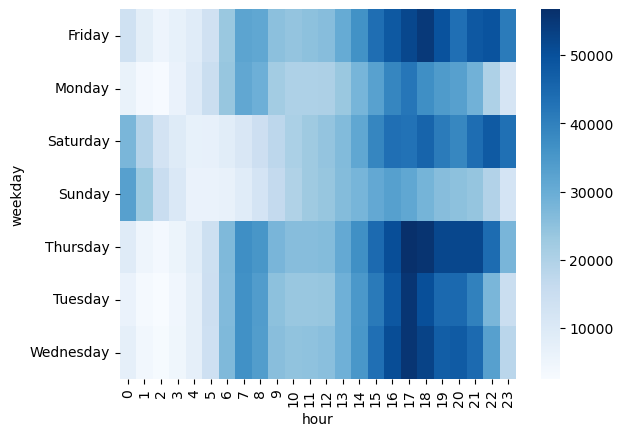

In [36]:
time_analysis(uber_14, 'weekday', 'hour')

<AxesSubplot:xlabel='weekday', ylabel='month'>

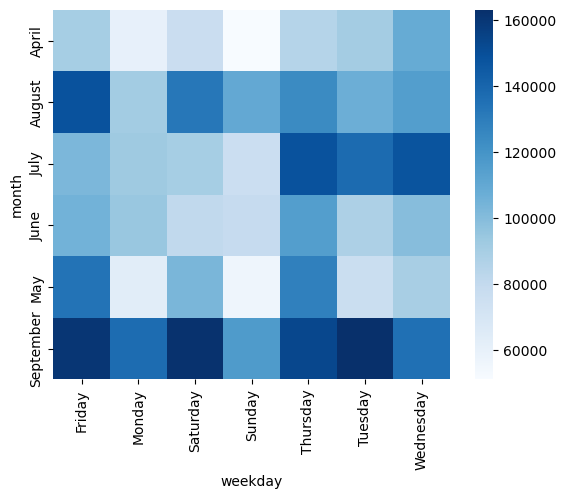

In [37]:
time_analysis(uber_14, 'month', 'weekday')

In [38]:
import folium
from folium.plugins import HeatMap

In [39]:
map_df = uber_14.groupby(['Lat', 'Lon'],as_index = False).size()

In [40]:
map_df.head()

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1


In [41]:
basemap = folium.Map()

In [42]:
basemap

In [43]:
HeatMap(map_df).add_to(basemap)

In [44]:
basemap

In [45]:
basemap.save('NY_Uber_14_map.html')

**Conclusion:**
1. September has the most orders from Apr to Sept in 2014
2. Manhattan is the busies area